In [1]:
from IPython.core.display import HTML
display(HTML("""
<script>
code_show=true;
function code_toggle() {
 if (code_show){
 $('div.input').show();
 } else {
 $('div.input').hide();
 }
 code_show = !code_show
}
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()">
<input type="submit" value="Click here to toggle on/off the raw code.">
</form>"""))

In [2]:
from textwrap import wrap
import requests
import sqlite3
from sqlalchemy import create_engine
import bs4
import json
import re
import time
import pickle
from PIL import Image
from tqdm import tqdm
from tqdm.notebook import trange

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import NMF

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, RegexpTokenizer

from nltk.stem.snowball import SnowballStemmer
from nltk.stem import PorterStemmer, WordNetLemmatizer

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [3]:
def clean_text(text, stop_words, lemmatizer):
    """
    Preprocess the text using lemmatization.
    """
    text = text.casefold()
    text_list = [
        lemmatizer.lemmatize(word)
        for word in re.findall(r'\b[a-z-]+\b', text)
        if word not in stop_words
    ]
    return ' '.join(text_list)

def vectorize(corpus, model, params):
    """
    Vectorize the corpus of articles using `model`.
    """
    vectorizer = model(**params)
    sparse_corpus = vectorizer.fit_transform(corpus)
    corpus_df = pd.DataFrame.sparse.from_spmatrix(
        sparse_corpus, columns=vectorizer.get_feature_names_out()
    )
    return corpus_df

def get_token_counts(df):
    """
    Return a series of the sum of weights of each token in the TF-IDF
    vectorized corpus.
    """
    return df.sum().sort_values(ascending=False)

def plot_top_words(model, feature_names, n_lf, n_top_words):
    """
    Plot the `n_top_words` in the NMF `model` for `n_lf` latent factors.
    """
    rows = int(np.ceil(n_lf/6))
    extra_axes = rows*6-n_lf
    fig, axes = plt.subplots(rows, 6, figsize=(30, 8*rows), sharex=True)
    axes = axes.flatten()
    for i in range(1, extra_axes+1):
        fig.delaxes(axes[-i])
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[:-n_top_words-1:-1]
        top_features = [feature_names[i] for i in top_features_ind]
        weights = topic[top_features_ind]

        ax = axes[topic_idx]
        ax.barh(top_features, weights, height=0.7)
        ax.set_title(f'LF{topic_idx+1}', fontdict={"fontsize": 30})
        ax.invert_yaxis()
        ax.tick_params(axis="both", which="major", labelsize=20)
        for i in "top right left".split():
            ax.spines[i].set_visible(False)
#     fig.suptitle(title, fontsize=40)

    plt.subplots_adjust(top=0.8, bottom=0.05, wspace=0.90, hspace=0.3)
    plt.show()
    
def plot_top_words_wc(model, feature_names, n_lf, n_top_words, lf_names,
                      mask):
    """
    Plot the `n_top_words` in the NMF `model` for `n_lf` latent factors.
    """
    def black_color_func(word, font_size, position, orientation,
                         random_state=None, **kwargs):
        return ("hsl(0,100%, 1%)")
    rows = int(np.ceil(n_lf/3))
    extra_axes = rows*3-n_lf
    fig, axes = plt.subplots(rows, 3, figsize=(15, 5*rows), sharex=True)
    axes = axes.flatten()
    for i in range(1, extra_axes+1):
        fig.delaxes(axes[-i])
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[:-n_top_words-1:-1]
        top_features = [feature_names[i] for i in top_features_ind]
        weights = topic[top_features_ind]
        
        wc = WordCloud(
            mask=mask,
            background_color='white',
            max_words=300,
            collocations = False,
            stopwords=stop_words,
            random_state=topic_idx+143,
        )
        
        tokens = pd.Series(weights, index=top_features)
        ax = axes[topic_idx]
        ax.imshow(wc.generate_from_frequencies(tokens),
                  interpolation='spline16')
        ax.axis('off')
        ax.set_title(lf_names[topic_idx], fontdict={"fontsize": 30})
        ax.imshow(wc.recolor(color_func=black_color_func))
#     fig.suptitle(title, fontsize=40)
    fig.tight_layout(pad=2)
#     plt.subplots_adjust(top=0.8, bottom=0.05, wspace=0.90, hspace=0.3)
    plt.show()

def plot_dist_year(year_dict, lf_names):
    """
    Plot the `n_top_words` in the NMF `model` for `n_lf` latent factors.
    """
    fig, axes = plt.subplots(2, 3, figsize=(22, 18))
#     fig.suptitle(title, fontsize=40)
    fig.tight_layout(pad=8)
    axes = axes.flatten()
    for yr, ax in zip(year_dict.keys(), axes):
        counts = (pd.Series(year_dict[yr]['W'][0].argmax(axis=1))
                  .replace(lf_names[yr])
                  .value_counts()
                  .sort_values()
                  .reset_index()
                  .to_numpy())
        ax.barh(
            [comp for comp in counts[:, 0]],
            counts[:, 1]
        )
        ax.set_title(f'{yr}', fontsize=20)
#         ax.set_ylabel('Topic', fontsize=15)
        ax.set_xlabel('Number of Articles', fontsize=20)
        ax.tick_params(axis="both", which="major", labelsize=15)
    fig.subplots_adjust(wspace=0.5)
    plt.show()

fig_num = 2
def fig_label(title, caption):
    global fig_num
    """
    Print figure caption on jupyter notebook
    """
    display(HTML(f"""<p style="font-size:14px;font-style:default;"><b>
                     Figure {fig_num}. {title}.</b><br>{caption}</p>"""))
    fig_num += 1
    
table_num = 1
def table_label(title, caption):
    global table_num
    """
    Print table caption on jupyter notebook
    """
    display(HTML(f"""<center style="font-size:14px;font-style:default;"><b>
                     Table {table_num}. {title}.</b><br>{caption}</center>""")
           )
    table_num += 1

# Executive Summary

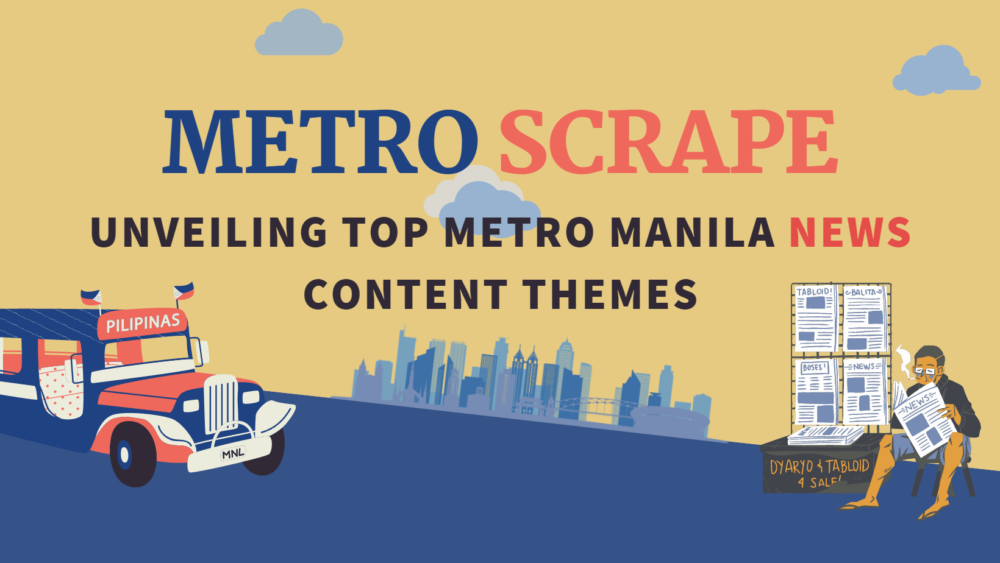

The power to disseminate information all over the country is a big responsibility to bear because it has the ability to influence the minds of the readers. This is both a burden and power that people have provided the News Media which has been further strengthened through the accessibility the digital age has created. In this study, the team aims to capture the issues and prevalent topics that Inquirer, the top news media outlet of the Philippines in accordance to Similarweb, relayed during the administration of our former President which may have significantly impacted the lives of Filipinos today. The team believes that there is merit in highlighting important social topics in order to create awareness to public officials which may result to better public policy initiatives. The team would also like to highlight the relevant social issues in order to drive support from society, concerned groups, or experts. Lastly, the team would like to identify news bias or partiality for us to check whether the news reports actually reflect the situation on the ground.
 
Armed with the above-mentioned motivation, the study acquired the data needed through scraped news articles from Inquirer’s website, specifically the Metro news section from June 30, 2016 to June 30, 2022. A total of 6,961 news articles were extracted with each article consisting of about 340 words on average. After extracting the data, the team conducted a short EDA to check its integrity and to identify stopwords to drop such as the word "said" whose frequency is high but does not add value to the interpretations. Lemmatization of text was also done to allow grouping of different inflections of words, for example, drug vs drugs. The resulting pre-processed text data are then vectorized using Term Frequency–Inverse Document Frequency (TF-IDF) wherein the latent factors were extracted through the use of Non-negative Matrix Factorization (NMF).  The extracted latent factors were then made as the designated themes or topics in our corpus.

Results showed that the top news topic for the first years of Duterte (that is, from 2016-2017) 	was Drug War. This was expected since one of Duterte’s best-known campaign promises is the 	eradication of drugs in the Philippines. For the next two years, that is from 2018-2019, popular 	news topics are found to be on Politics. This was briefly turned over by COVID-19 related news 	topics in 2020 which was the year when the world entered the pandemic. Politics-related news topics returned as the most popular topic in the following year, 2021, which was the start of the 	elections campaign. Throughout the six-year term of the former President, topics such as Traffic 	Incidents, Transportation, and Fire Incidents are also consistently prevalent. These are among 	the topics that the team believes are social concerns that our leaders should further investigate.

In summary, the team was able to meet the main objective of this project which is to extract the 	top news topics or themes during President Rodrigo Duterte’s six-year term using Non-Negative 	Matrix Factorization.

The team recommends the use of more advanced Natural Language Processing (NLP) and 	Clustering techniques to identify critical social issues from news articles. The team further 	recommends the collection of news articles from other digital media news resources to improve 	the credibility of the results of the project and to highlight more valuable insights.


# Introduction

## Background of the Study

A wise man once said that "*The free press is needed by the government, the government which still dreams of the prestige which it builds upon mined ground.*" There is power in News media. Do you agree? Especially in today's digital age, when information is easily accessible to anyone. The media can shape the way society thinks.

In the case of news reports, whether it be via broadcast or articles, news has shown to be significant in affecting current events, for better or for worse. Prime examples are the up-and-down trend of stock prices, a corporation's success or collapse, the resignation of senior officeholders, and even bringing down Presidents. News has always been a key force in society with heavy responsibilities. Part of the news and their publications’ responsibility is to put under a microscope societal and current event. With this, they then provide information to society. On top of this, news helps in creating, shaping, and influencing public opinion and even strengthening societies. As such, the relevance of news has spanned generations. With this, the team wanted to investigate how the news reflects what happened in society, particularly in Metro Manila during Duterte’s Administration, to see how the news fulfills its responsibilities in action. The team would like to know what issues were captured by the news media during this time that are possibly still significant in the lives of Filipinos today.


## Problem Statement

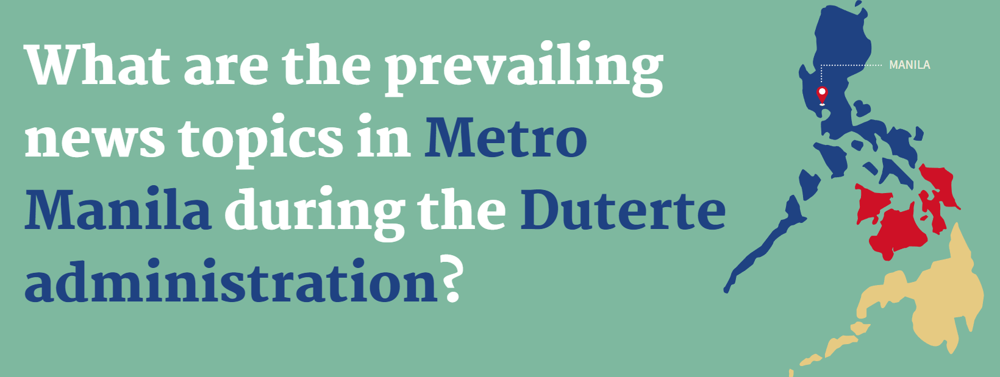

## Business Value

This study encompasses a myriad of use-cases and business values; some of which are:
1. Better public policy initiatives

Identifying what are the recurring and prevalent social issues may help create awareness to the society, particularly the masses. With this awareness, dialogue on these topics will push both the local and national government to focus on these issues and act by creating relevant policies.  However, there are a plethora of pressing social issues, and this study will help identify which social issues are more pressing than the others.

2. Help provide better support

In addition to government policies, awareness of issues may attract certain experts and those of whom will help foster collaboration with relevant parties in both public and private sectors. This study will aid in that awareness and help jumpstart collaboration.

3. Identify news bias or partiality

Checks and balance are important for any news and media publications as they are looked to by the people for unbiased and impartial news. As such, these companies and/or organizations can utilize this study to monitor if they are dwelling and/or siding too much on one side. This will allow them to pivot and re-position. 


## Scope and Limitations

The following are the scope and limitations that guided the team in this study:

1. Data source

The team's raw data was solely from `Inquirer.net`; the team chose this news publication as they were ranked by Similarweb.com as the top Philippine news publishing site (Similarweb, October 2022). From Inquirer.net, the team further limited the study to the Metro news section; as such, only news from the National Capital Region (NCR) was included. 

2. Period and Subject of Focus

The team only focused on the six years of the Duterte Administration, which was from June 30, 2016, up to June 30, 2022. 


# Methodology

## Overview

The methodology is composed of five steps which will be discussed on the next sections and is summarized in the figure below.

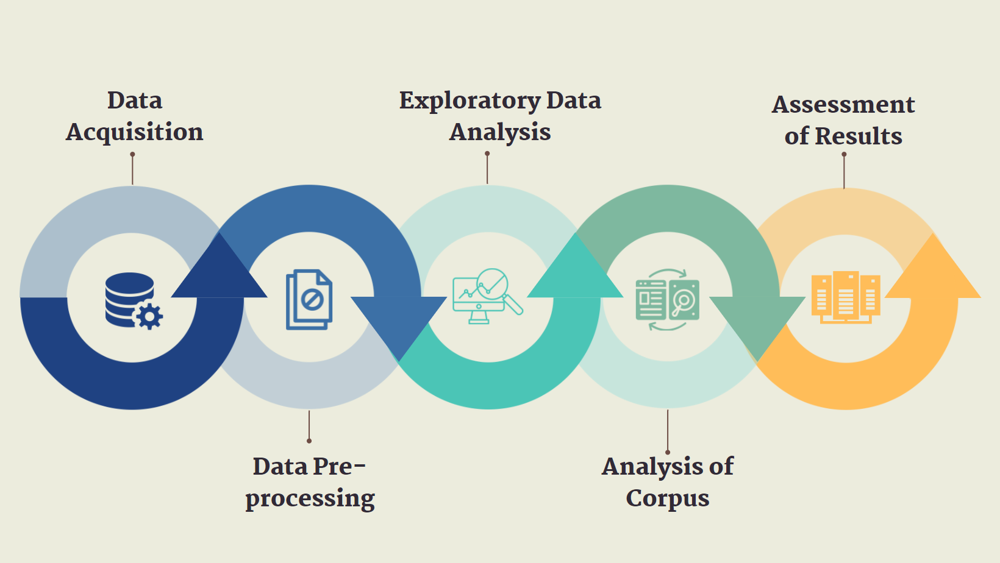

**Figure 1. Overview of the Methodology.**

## Data Acquisition

The data was acquired by webscraping the Metro section `newsinfo.inquirer.net` within the period from June 30, 2016 to June 30, 2022. The table below shows the information that were scraped and then stored into a dataframe to be used for further processing:

| Feature | Datatype | Description |
|:--------|:----------|:----------|
| `title` | object | Title of the news article |
| `link` | object | Web link of the news article |
| `date` | object | Publish date (YY-MM-dd) |
| `year` | int | Publish year |
| `text` | object | Content of the news article |

<br>
<center><b/> Table 1. Description of the Data. </center>

## Data Preprocessing

In [4]:
# Load the dataset.
metro = pd.read_csv('all_scraped_metro_news.csv')

# Filter by date (include only Duterte admin time).
metro.date = pd.to_datetime(metro.date)
metro = metro[(metro.date < '2022-06-30') & (metro.date >= '2016-06-30')]

# Remove 'did you know' articles because they are not news.
metro = (metro[~(metro.title.str.lower().str.contains('did you know'))]
         .sort_values('date')
         .reset_index(drop=True))

# Remove the promotion Subscribe to INQUIRER PLUS at the end of the texts.
metro.text = metro.text.apply(lambda x: x[:x.find('Subscribe')])

# Regroup the articles (new year starts after June 30).
indices = [0]
years = [2016, 2017, 2018, 2019, 2020, 2021]
for year in years:
    indices.append(
        metro[(metro.date < f'{year+1}-06-30')].iloc[-1].name
        + 1 - sum(indices)
    )
indices = indices[1:]

# Overwrite the year feature with the new groupings.
year_list = []
for idx, year in zip(indices, years):
    year_list.extend([year]*idx)
    
metro.year = pd.Series(year_list)

# Remove article with no text.
metro = metro.drop(index=4059).reset_index()

metro = metro[['title', 'date', 'year', 'link', 'text']]

The following preprocessing steps were conducted to clean the dataset.
1. Drop articles that whose titles contain `did you know` as they only provide trivia instead of news and are therefore irrelevant to the study.

2. Remove text inside each articles (e.g., `subscribe to Inquirer PLUS` at the end of the texts) which do not correspond to news content.

3. The articles were regrouped to a yearly basis based on Duterte's term (eg. The `2016` label will correspond to June 30, 2016 to June 30, 2017).

4. Aggregate a list of stop words to drop prior to vectorization.

5. Lemmatize text using `nltk`s `WordNetLemmatizer` to different inflections of words together (eg. `drug` and `drugs`).

These preprocessing steps will set up the data for vectorization and NMF implementation.

## Exploratory Data Analysis

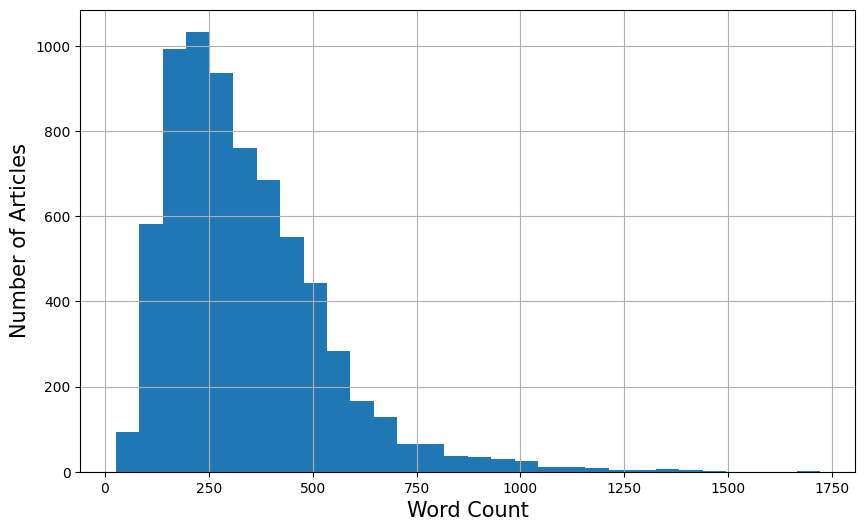

In [5]:
text_lengths = metro.text.apply(lambda x: len(x.split()))

fig, ax = plt.subplots(figsize=(10, 6))
text_lengths.hist(bins=30, ax=ax)
ax.set_xlabel('Word Count', fontsize=15)
ax.set_ylabel('Number of Articles', fontsize=15)
plt.show()

fig_label('Distribution of Articles in the Corpus by Word Count',
          'There are 6960 articles in the news articles corpus consisting of '
          '337 words on average.')

In the figure above, the team have taken 6960 articles of Inquirer from year 2016 to 2021 for Metro Manila and created a histogram plot to segment the distribution of articles by number of word count. The plot indicates that the articles with word counts between 200 to 250 have the highest occurrences within the dataset. The longest articles have word counts nearing 1750 words and the mean consisting of 337 words on average.

In the context of Inquirer articles, the average standard word count that they have set is their perceived optimal number of words used to relay their message without overwhelming their readers for their daily articles. In the case of articles that are above the average may indicate articles in need of vast detail and update similar to the COVID-related articles which contains necessary information such as protocols and updates.

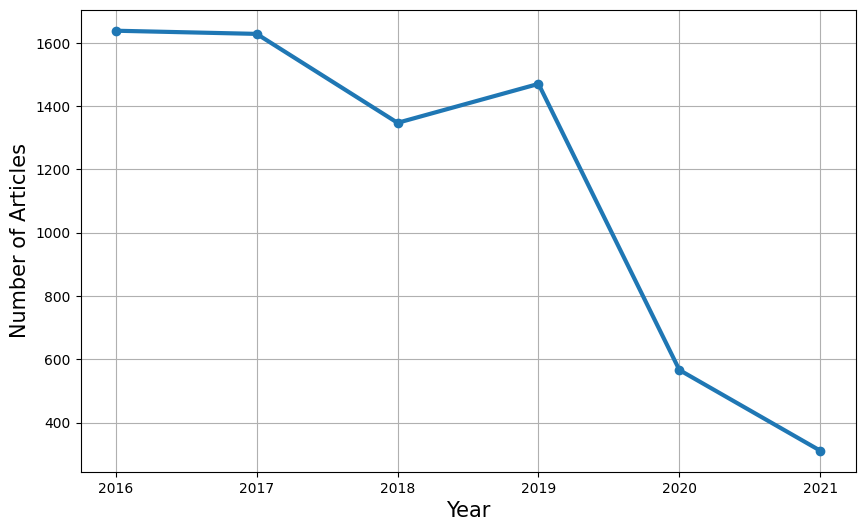

In [6]:
fig, ax = plt.subplots(figsize=(10, 6))
metro.year.value_counts().sort_index().plot(ax=ax, style='o-', linewidth=3)
ax.set_xlabel('Year', fontsize=15)
ax.set_ylabel('Number of Articles', fontsize=15)
ax.grid()
plt.show()

fig_label('Trend of Article Count in Inquirer Metro News per Year',
          'There was a decrease in the number of published articles from 2016'
          ' to 2021.')

The figure above showcases a trend line of the number of articles Inquirer has produced over the span of 6 years since June 30, 2016 for Metro Manila. We could notice a slight decline in the year 2018 and a steep drop from 2019 towards 2020 and 2021. One reason we can surmise from these information, especially with regards to the huge decline from year 2019, would be the timing of the year of closing of ABS-CBN at 2020 which was a huge indicator of the turbulent time for any journalist and media outlet. Furthermore, the amount of decrease may also be a result of the change in work conditions caused by the pandemic.

## Analysis of Corpus

This section discusses the steps on how the team arrived on creating a corpus which is a collection of text that will be used to discover information about the news articles during Duterte administration. The team defined a list of stopwords from `nltk` and `wordcloud` as well as words such as `said` which occur frequently but do not add value to interpretation.

The team lemmatized the texts which is a process of grouping the inflected forms of word so they can be analyzed as a single item (e.g., `change`, `changing`, `changes`, `changed`, `changer` could be grouped into `change`). This was done to reduce the dimension of the dataframe prior to vectorization. The team also identified the stop words which is a set of commonly used words in a language as it needs to be deleted because they are insignificant which also reduces the dataframe.

In [7]:
# Define the list of stopwords
stop_words = (list(set(stopwords.words('english') + list(STOPWORDS)))
              + ['one', 'two', 'three', 'four', 'five', 'six', 'seven',
                 'eight', 'nine', 'let'])

# Instantiate the lemmatizer
lemmatizer = WordNetLemmatizer()

# Drop irrelevant tokens (identified through inspection).
drop_cols = ['around', 'added', 'told', 'still', 'found', 'may', 'de', 'san',
             'even', 'asked', 'along', 'including', 'among', 'take', 'due',
             'ng', 'made', 'took', 'yet', 'went', 'want', 'without', 'saying',
             'na', 'told inquirer', 'sa', 'able', 'state', 'say', 'led',
             'see', 'within', 'put', 'must', 'city', 'said']

# Define the parameters of TfidfVectorizer
tfidf_params = dict(
    ngram_range=(1, 2),
    token_pattern=r'[a-z-]{2,}',
    stop_words=stop_words,
    max_df=0.975,
    min_df=0.025,
    max_features=None
)

### Vectorization

 The team then vectorized the dataframe which is the process of converting text into numerical representation. The vectorization included both unigrams and bigrams with a minimum and maximum document frequency of 2.5% and 97.5%, respectively.

In [8]:
# Lemmatize the text
metro.text = metro.text.apply(lambda x: clean_text(x, stop_words, lemmatizer))

# Vectorize the corpus
corpus = vectorize(metro.text, TfidfVectorizer, tfidf_params)

# Get the top tokens in the corpus
tokens = get_token_counts(corpus)

The team used the **Frobenius norm** to determine how many latent factors will be used. Based on the plot above there is a noticeable elbow at three but the team believes that categorizing the news into three will not give a comprehensive grouping to be discussed. Hence, the team agreed upon using a latent factor of six as it seems a digestible number of groups.

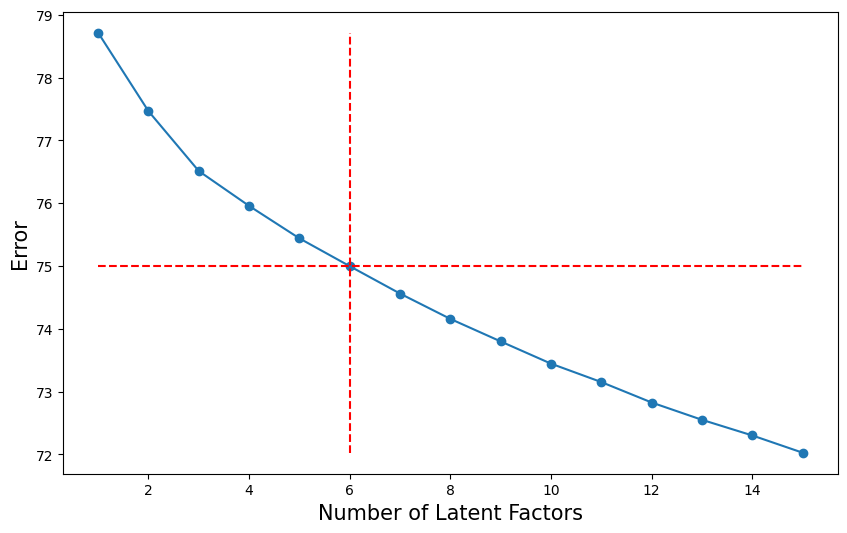

In [9]:
V = corpus[tokens.index].drop(columns=drop_cols)

k_range = 15

try:
    with open('error_list.pkl', 'rb') as f:
        error_list = pickle.load(f)
except:
    error_list = []
    for k in trange(1, k_range+1):
        nmf_params = dict(
            n_components=k,
            solver='mu',
            beta_loss='frobenius',
            max_iter=10_000,
            random_state=6
        )
        nmf = NMF(**nmf_params)
        W = nmf.fit_transform(V)
        H = nmf.components_.T

        error = np.sqrt(np.sum((V.to_numpy() - (W @ H.T))**2))
        error_list.append(error)

        with open('error_list.pkl', 'wb') as f:
            pickle.dump(error_list, f)

fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(range(1, k_range+1), error_list, 'o-')
ax.set_xlabel('Number of Latent Factors', fontsize=15)
ax.set_ylabel('Error', fontsize=15)
ax.hlines(y=error_list[5], xmin=1, xmax=15,
          colors='red', linestyles='--')
ax.vlines(x=6, ymin=min(error_list), ymax=max(error_list),
          colors='red', linestyles='--')
plt.show()

fig_label('Plot of Number of Latent Factors vs The Frobenius Norm Error',
          'A subtle knee can be observed at 3 LFs.')

### Non-negative Matrix Factorization

Non-negative Matrix factorization decomposes the design matrix into two matrices. The team used a latent factor of six and the result is shown below:

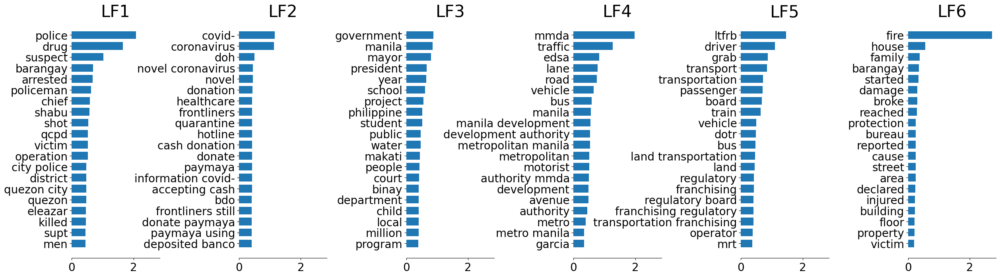

In [10]:
V = corpus[tokens.index].drop(columns=drop_cols)

n = 6

nmf = NMF(
    n_components=n,
    solver='mu',
    beta_loss='frobenius',
    max_iter=10_000,
    random_state=6
)
W = nmf.fit_transform(V)
H = nmf.components_.T

plot_top_words(nmf, V.columns, nmf.n_components_, 20)

fig_label('Latent Factors in the Corpus',
          'The top weighted words for LF1 to LF6 are police, covid-,'
          ' government, mmda, ltfrb, and fire, respectively.')

The plot above shows the six latent factors that were formed from the corpus. Each group contains the word that best represents its topic or theme. The next step is to interpret each latent factor. This will be discussed in the next section.

### Theme Analysis

For a better representation of texts and its corresponding weight per group, the team created a word cloud for each latent factor. Upon analysis and using the top six representation of news categories, the image shown below states that news can be grouped as `Drug War`, `COVID-19`, `Politics`, `Traffic incidents`, `Transportation` and `Fire incidents`. These are the prevailing news topics during the Duterte administration:

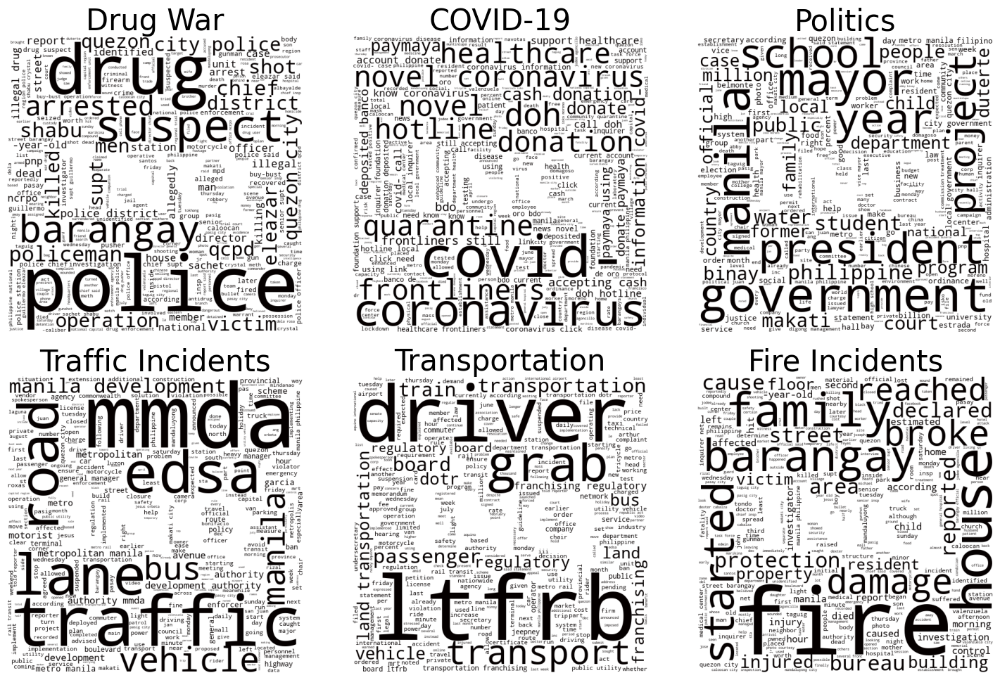

In [11]:
topic_dict = {
    0: 'Drug War', 1: 'COVID-19', 2: 'Politics',
    3: 'Traffic Incidents', 4: 'Transportation', 5: 'Fire Incidents'
}
mask = np.array(Image.open("inq.png"))
plot_top_words_wc(nmf, V.columns, nmf.n_components_, 300, topic_dict, mask)

fig_label('Topics in News Articles during Duterte Administration', 
          'Drug War, COVID-19, Politics, Traffic Incidents, Transportation, '
          'and Fire Incidents are the prevailing news topics during the '
          'Duterte administration.')

In [12]:
# Generate trend plot for Results and Discussion

groupings = (pd.concat([metro[['year', 'title']],
                       pd.Series(W.argmax(axis=1), name='topic')], axis=1)
             .groupby(['topic', 'year']).size())

trendline, ax = plt.subplots(figsize=(15, 8))

topics = [
    'Drug War', 'COVID-19', 'Politics',
    'Traffic Incidents', 'Transportation', 'Fire Incidents'
]

articles_per_year = metro.year.value_counts().sort_index()

for i, topic in enumerate(topics):
    (groupings.loc[i] / articles_per_year).plot(ax=ax, style='o-',
                                                label=topic)
#     ax.set_title('Trend of News Topics by Year', fontsize=25)
    ax.set_xlabel('Year', fontsize=20)
    ax.set_ylabel('Proportion', fontsize=20)
    ax.legend()
    ax.grid()
    
trendline.canvas.draw()
plt.close()

## Analysis of Yearly Subcorpora

This section implements a deeper analysis by considering yearly subcororpa and extracting themes for each of them independently.

### Vectorization

The same vectorization process on the **Analysis of Corpus** section was done but instead of using the entire corpus, only a subcorpus on a certain year was used. See **Section 3.5.1 Vectorization** for reference. 

In [13]:
years = np.sort(metro.year.unique())

year_dict = {}
for yr in years:
    corpus = vectorize(
        metro[metro.year==yr].text, TfidfVectorizer, tfidf_params
    )
    V = corpus.drop(columns=drop_cols, errors='ignore')
    nmf=NMF(
        n_components=6,
        solver='mu',
        beta_loss='frobenius',
        max_iter=10_000,
        random_state=6
    )
    W=nmf.fit_transform(V),
    H=nmf.components_.T
    year_dict.update({
        yr: dict(corpus=corpus, V=V, nmf=nmf, W=W, H=H)
    })

### Non-negative Matrix Factorization

The team performed the same process in **Section 3.5.2 Non-negative Matrix Factorization** which is broken down yearly. Below is the resulting Latent Factors in the 2020 subcorpus. See the **Appendix** section for the implementations for the other years.

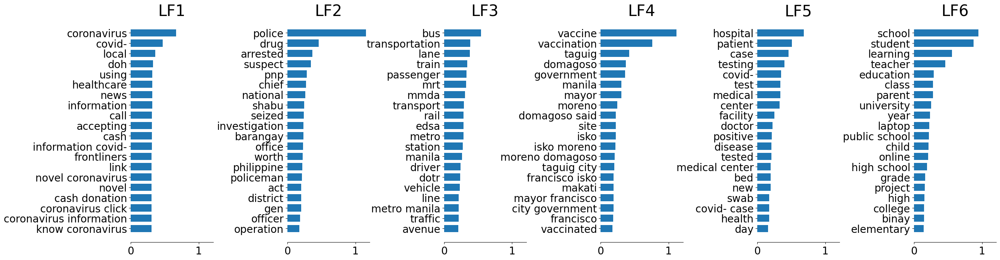

In [14]:
yr = 2020
plot_top_words(
        year_dict[yr]['nmf'],
        year_dict[yr]['V'].columns,
        year_dict[yr]['nmf'].n_components_,
        20
)

fig_label(f'Latent Factors in the {yr} Subcorpus', 
          'The top weighted words for LF1 to LF6 are coronavirus, police,'
          ' bus, vaccine, hospital, and school, respectively.')

### Theme Analysis

Using the yearly Subcoropa, the themes were interpreted on a yearly basis. The set of themes appear to change per year depending on the best description of the word cloud formed. Below is a sample of topics of news articles during 2020. See the **Appendix** section for the full results.

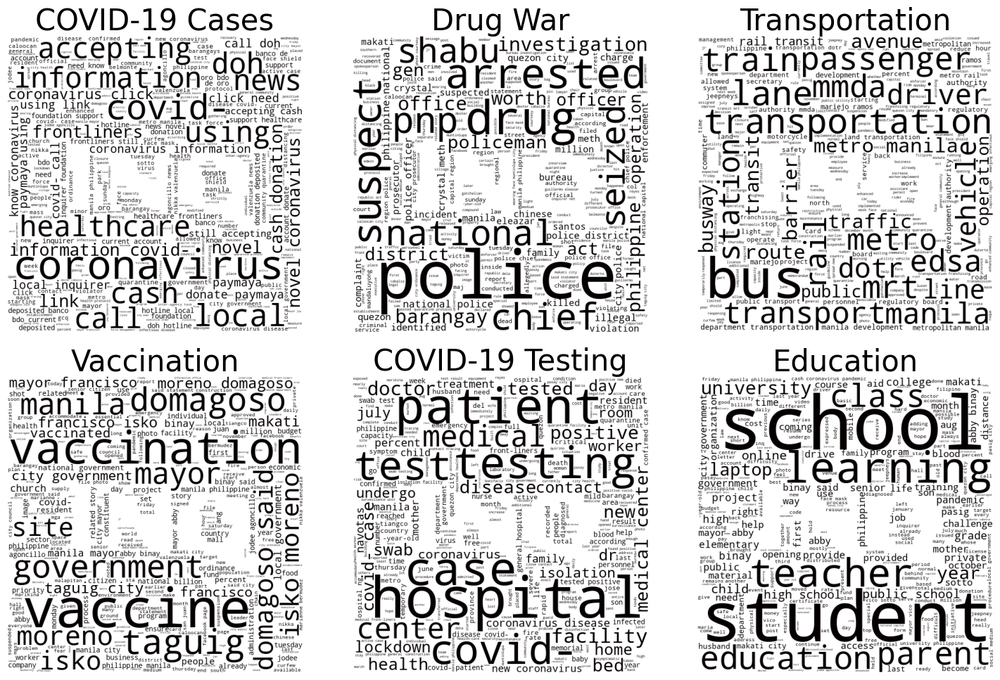

In [15]:
# Topic List
lf_names_dict = {
    2016: {0: 'Drug War', 1: 'Traffic Incidents', 2: 'Government',
           3: 'Fire Incidents', 4: 'PNP Police', 5: 'Quezon City Police'},
    2017: {0: 'Killing Incidents', 1: 'Government', 2: 'Transportation',
           3: 'Traffic Incidents', 4: 'Drug War', 5: 'Rail Transit'},
    2018: {0: 'Police Operations', 1: 'Traffic Incidents',
           2: 'Makati Election', 3: 'Manila Water', 4: 'Transportation',
           5: 'Drug War'},
    2019: {0: 'COVID-19', 1: 'Police Operations', 2: 'Politics',
           3: 'Traffic Incidents', 4: 'Fire Incidents', 5: 'Drug War'},
    2020: {0: 'COVID-19 Cases', 1: 'Drug War', 2: 'Transportation',
           3: 'Vaccination', 4: 'COVID-19 Testing', 5: 'Education'},
    2021: {0: 'COVID-19', 1: 'Drug War', 2: 'Fire Incidents', 3: 'Quarantine',
           4: 'Politics', 5: 'Transportation'}
}
mask = np.array(Image.open("inq.png"))
yr = 2020
plot_top_words_wc(
    year_dict[yr]['nmf'],
    year_dict[yr]['V'].columns,
    year_dict[yr]['nmf'].n_components_,
    300,
    lf_names_dict[yr],
    mask
)
fig_label(f'Topics in News Articles during {yr}', 
          'COVID-19 Cases, Drug War, Transportation, Vaccination,'
          ' COVID-19 Testing, and Education are the prevailing news topics '
          'during the Duterte administration.')

# Results and Discussion

## Analysis of Corpus

After applying vectorization, NMF and theme analysis on the dataset, the plot below shows the prevailing news topics during the Duterte Administration from 2016 to 2021. Each prevailing news topic has a corresponding color for better visualization. The $y$-axis corresponds to the proportion of articles for a topic while the $x$-axis corresponds to the years 2016 to 2021. It is separated at six points for the six years of presidency of the former president.

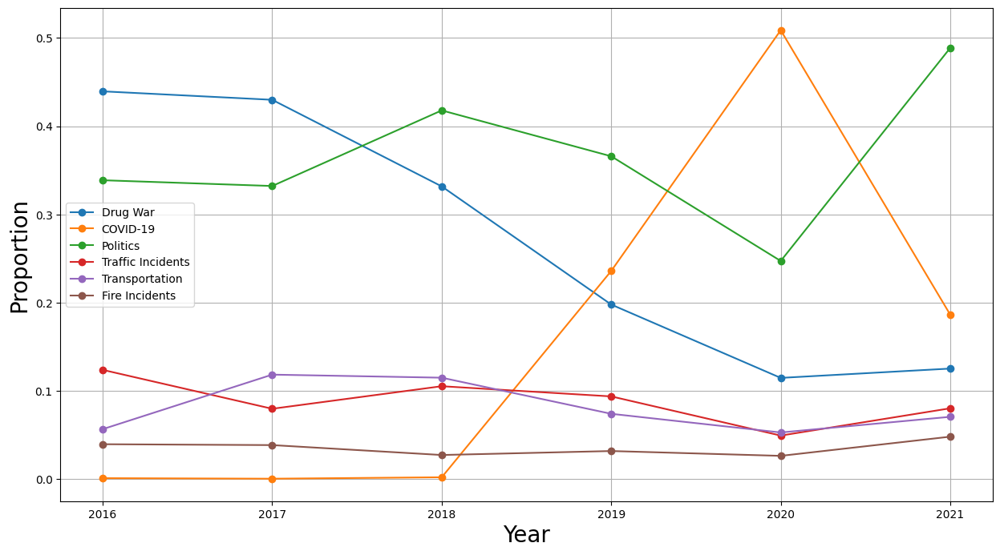

In [16]:
display(trendline)

fig_label('Trend of News Topics by Year',
          'The top topics chronologically from 2016 to 2021 are Drug War, '
          'Politics, COVID-19, and Politics, respectively.')

In 2016, the top prevailing topics were **Drug War** and **Politics**. This was when President Duterte’s war on drugs was prevalent in the whole country. Politics came in second due to the conclusion of the presidential elections in the same year. In 2017 and 2018, Drug War and Politics remained in the top 2 spots. In 2019, the articles for COVID-19 rose and secured the 2nd most article count. The fear of COVID-19 increased as there were cases happening around the globe. The articles of Drug War continued to decline and settled for the 3rd most article count in this year. In 2020, COVID-19 reached the highest count for articles in this dataset. As COVID-19 cases grew, lockdowns and resources shortages were happening across the archipelago. COVID-19 vaccinations and testing were also part of the news articles and often talked about, as they were created for protection against the virus. Finally in 2021, there was a decrease in the proportion of COVID-19 related news in favor of Politics owing to the campaigns for the 2022 national elections which became prominent during this time.

## Analysis of Yearly Subcorpora

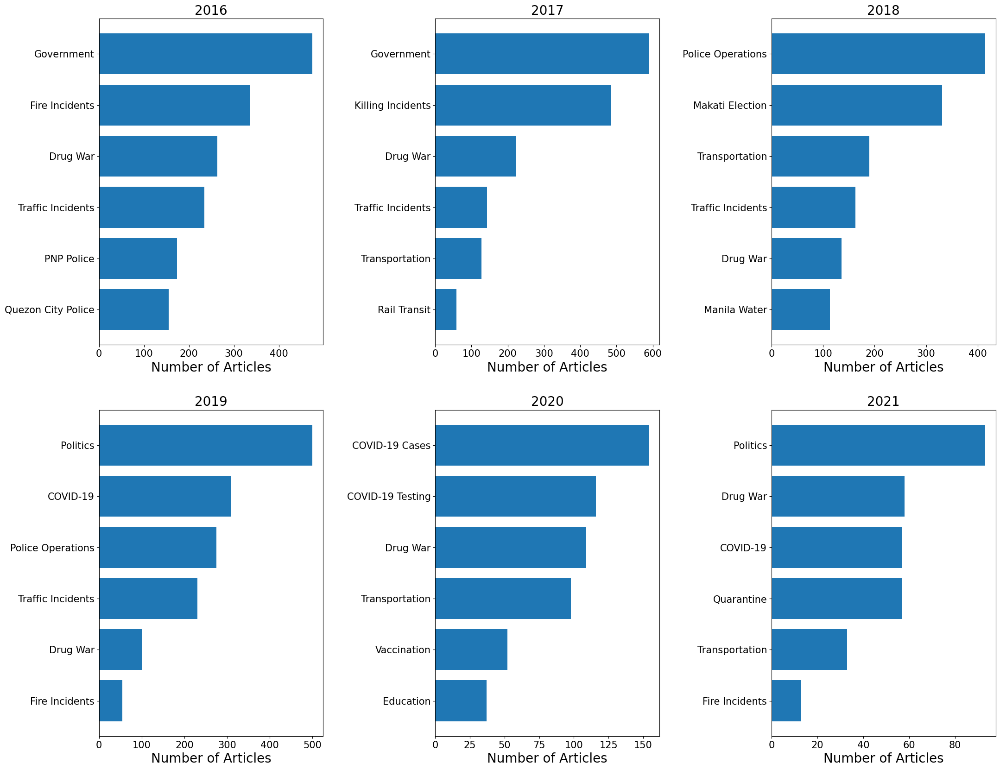

In [17]:
plot_dist_year(year_dict, lf_names_dict)

fig_label('Top News Topics for Each Year',
          'The highest proportion of Topics for 2016 to 2021 are Government, '
          'Government, Police Operations, Politics, COVID-19 Cases, and '
          'Politics, respectively.')

To obtain a clearer picture of the top news topics every year, the team decided to compare them in a year-by-year basis. The team wanted to find out what the prevailing news topics are for each year from 2016 to 2021. For the years 2016 and 2017, the top 4 news topics for both years were similar wherein articles in Government, Fire/Killing Incidents, Drug War and Traffic Incidents were present. The only differences are the fifth and sixth highest proportion. 2016 had PNP Police and QCPD. This can be insinuated as part of the war on drugs of President Duterte. On the other hand, 2017 had transportation and rail transit. In 2018, transportation, traffic incidents and drug war are still present as the top news topics. Police operations and Makati Election take the top 2 spots. Due to the senatorial elections, politics takes the top spot of the highest proportion of news in 2019. Covid-19 also had an increase in articles during this year, getting the second highest proportion. The rest of the news topics are similar to the prior years. For 2020 and 2021, Covid-19 and politics take the top spots for each year, respectively. Other topics include Covid-19 related topics such as testing, vaccination, and quarantine. As mentioned, politics tops 2021 as the campaign for the Presidential elections have begun.


# Conclusion

Using non-negative matrix factorization (NMF), the team was able to perform topic modeling of news content in the Metro Section of Inquirer.net during the Duterte Administration, that is, from June 30, 2016 to June 30, 2022. More specifically, the team was able to identify the prevailing news topics for each year from the resulting latent factors obtained from the NMF model.

The top news topic during the first two years of the term of Duterte was his war against drugs. This is from 2016-2017. About 45% of the news articles are from this topic. We can also notice a drop on these news articles to about 13% at the end of Duterte's term. Two years after his term, the top news topic was replaced by politics-related news. This also lasted for two years, that is from 2018-2019. Around 40% of all news articles were politics related. 2020 marked the start of the pandemic, and it is expected that during this period, COVID-19 related news would be the top topic. The team also observed that news related to COVID already had dropped from 51% to 19% by 2021. From June 2021 to June 2022, the prevailing topics yet again included those that are politics related. This is indicative of the relevance of the campaigns for the 2022 national elections. Another important insight is that transportation and traffic incidents were consistently reported throughout the six years term, where each of these two topics comprise 10% of the total news articles for each year. In addition to these two, fire incidents which comprise 5% of the total articles were also consistently present topics. From these results, we can infer that these three topics are common social issues that needed to be addressed by the government. Further evaluation may be conducted to see whether issues related to these topics are being resolved or not. The team also observed that topics related to the highlight of the term of Duterte which includes his infrastructure projects did not emerge as one of the most popular topics. The team recommends to investigate whether bias exists in the news delivery of Inquirer.

# Recommendations

This project does not come without limitations, which is why at this point, the team would like to raise here a few recommendations that future researchers might take into consideration. First, is the use of more advanced Natural Language Processing (NLP) and Clustering techniques to extract more specific news content themes. A classification of extracted themes based on whether a specific category raises social issues or not using more advanced techniques is also recommended. A comparison of news articles from different news media websites aside from Inquirer.net may also be done to improve the credibility of the results and to also check for any impartiality of the delivery of news among different digital news media sources. In addition to these, the scope of the study may also be expanded to include news articles not just in Metro Manila but also in the Philippines.

Based on the results of this study, the following are the recommendations of the team. Government leaders should further investigate extracted themes such as traffic incidents, transportation, and fire incidents which were found to be consistently occurring topics of news articles. Resolutions on these critical issues should be initiated and implemented. Doing so may provide social and economic advantages for Metro Manila. The model introduced in this project may also be adopted and used by our leaders to continuously monitor important social concerns that are not as popular but require attention.


# References

- Inquirer.net Traffic Analytics & Market Share. Retrieved December 6, 2022, from [SimilarWeb](https://www.similarweb.com/website/inquirer.net/).

- Inquirer.net Metro News. Retrieved December 6, 2022, from [Metro Inquirer News](https://newsinfo.inquirer.net/category/inquirer-headlines/metro).

- News Media and Social Problems. Retrieved December 1, 2022 from [Boisestate](https://www.boisestate.edu/bluereview/news-media-social-problems/).
- What is Non- Negative Matrix Factorization. Retrieved December 6, 2022, from [Medium](https://medium.com/codex/what-is-non-negative-matrix-factorization-nmf-32663fb4d65).
- Thematic analysis of qualitative data: AMEE Guide No. 131. Retrieved on December 1, 2022 from [Plymouth](https://www.plymouth.ac.uk/uploads/production/document/path/18/18247/Kiger_and_Varpio__2020__Thematic_analysis_of_qualitative_data_AMEE_Guide_No_131.pdf.).


# Appendix

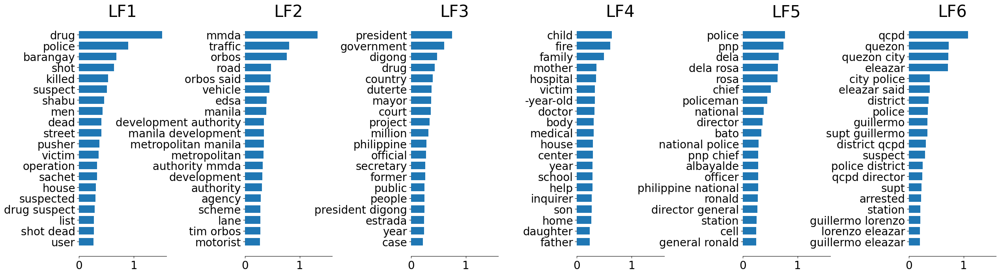

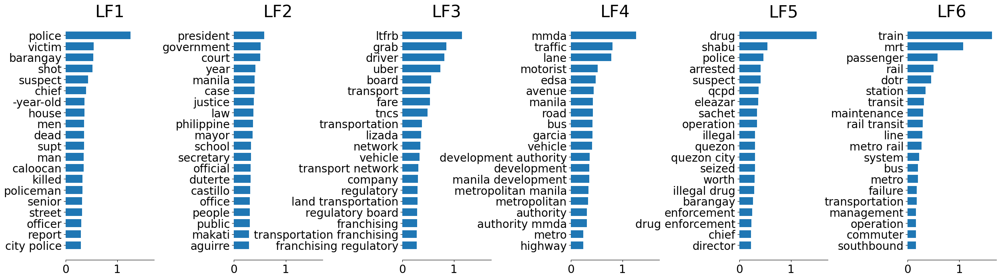

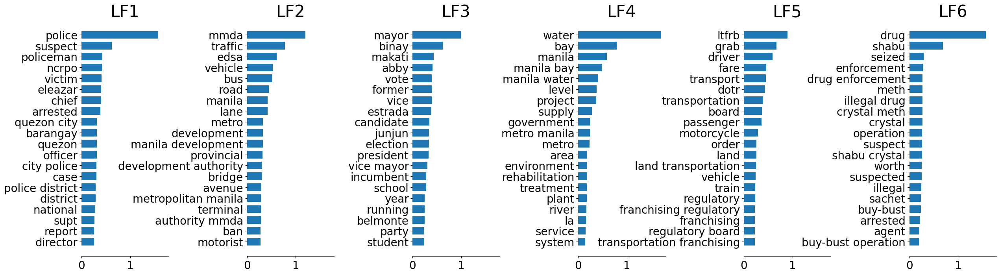

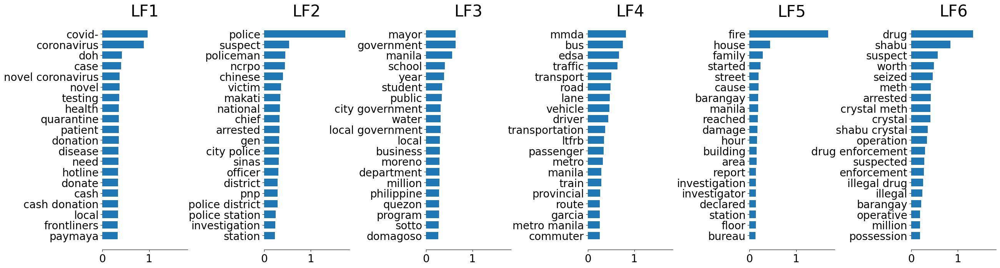

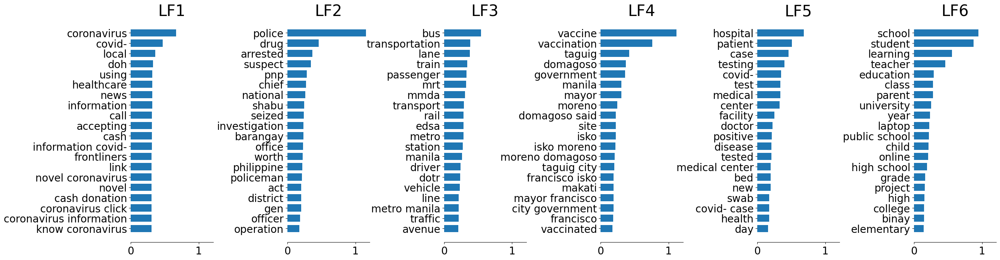

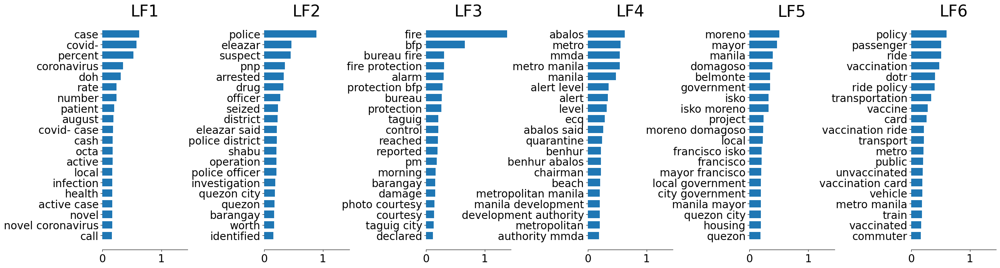

In [18]:
fig_label('Plot of the Top Occuring Words in each LF by Yearly Subcorpus', '')

for yr in years:
    display(HTML('<center>'+f'<font size="+2"/><b/>{yr}'+'</center>'))
    plot_top_words(
        year_dict[yr]['nmf'],
        year_dict[yr]['V'].columns,
        year_dict[yr]['nmf'].n_components_,
        20,
    )

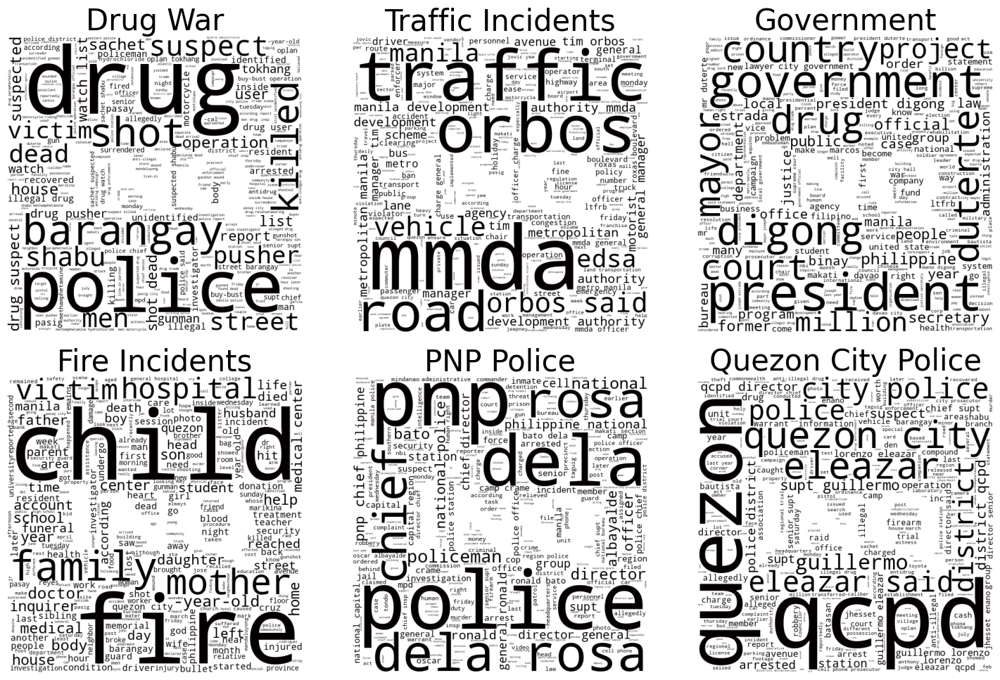

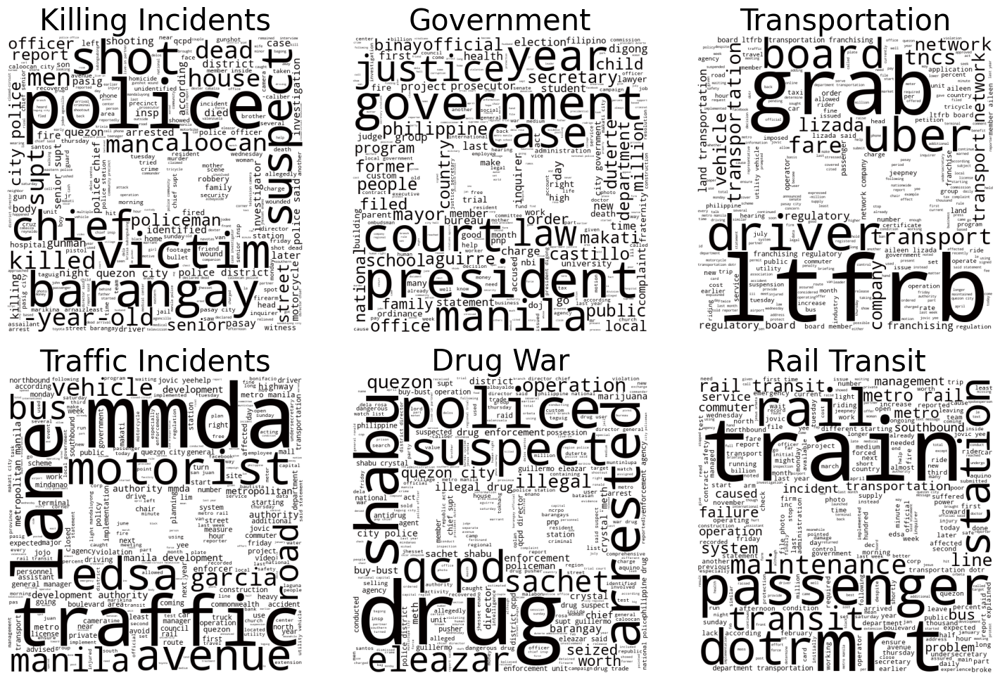

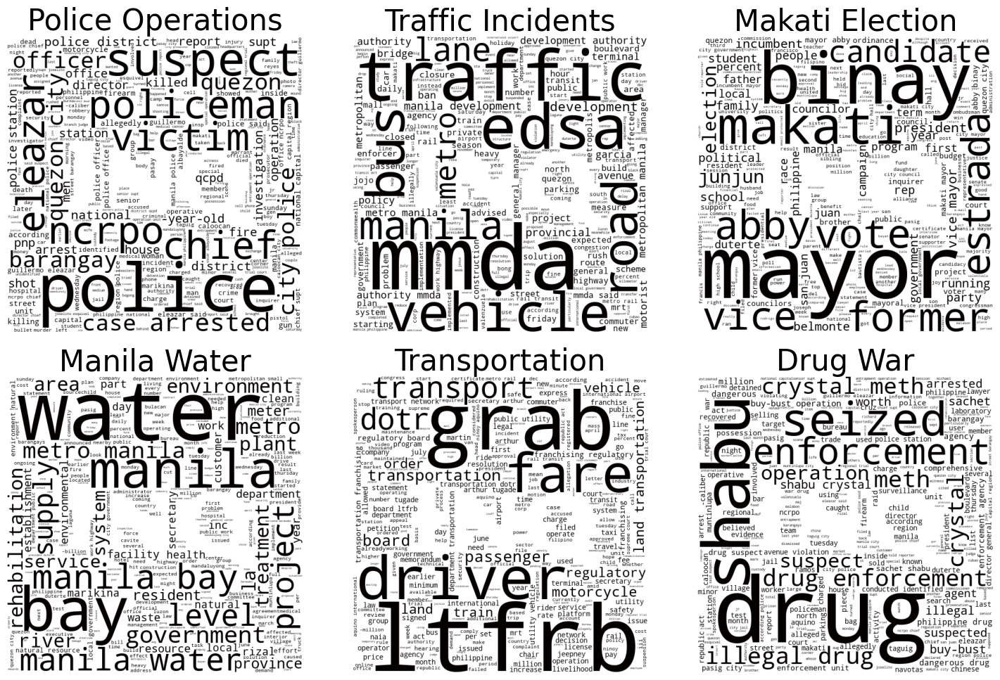

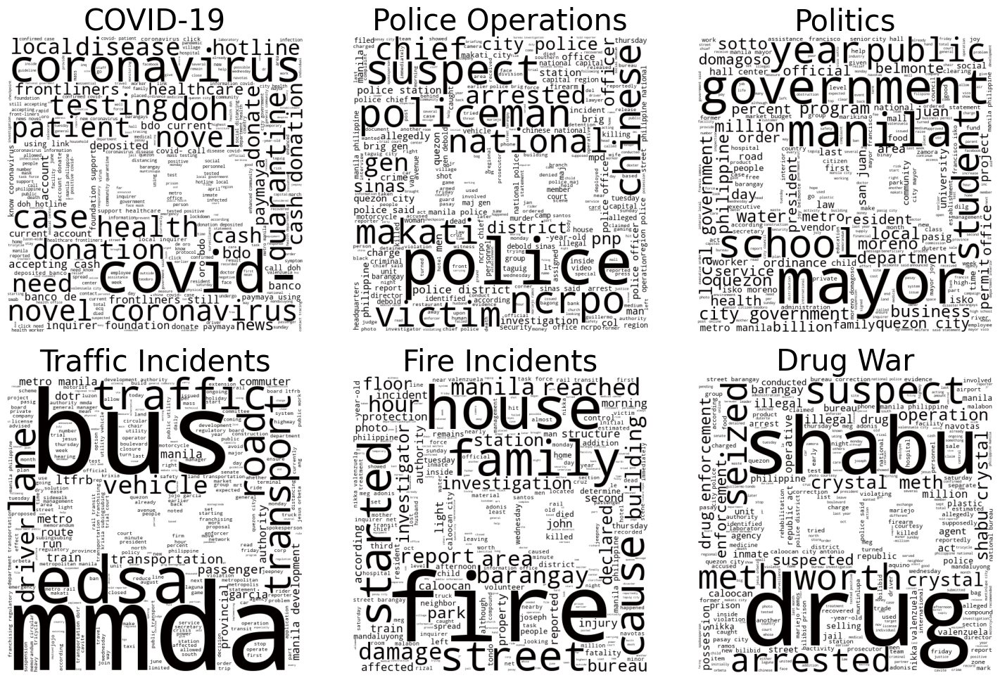

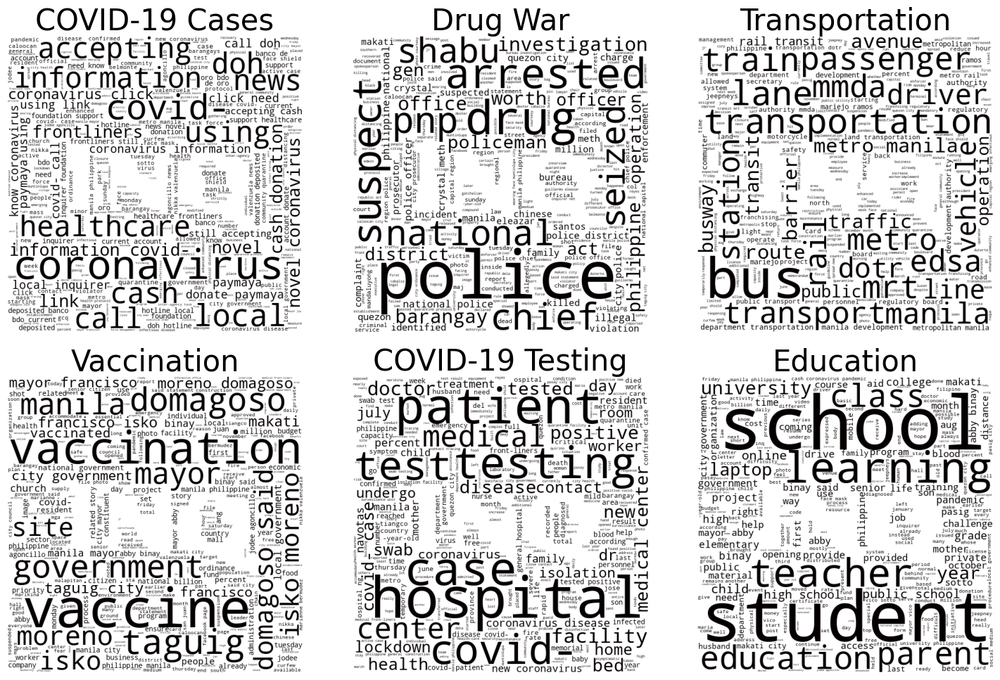

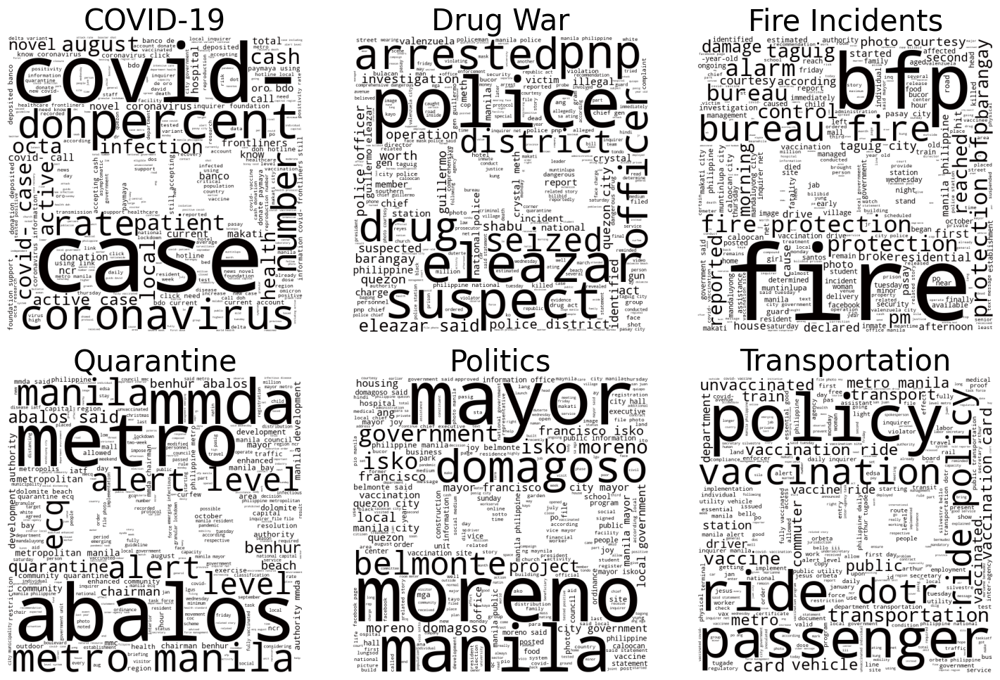

In [19]:
fig_label('Word clouds of the Top Occuring Words in each LF by Yearly'
          ' Subcorpus', '')

for yr in years:
    display(HTML('<center>'+f'<font size="+2"/><b/>{yr}'+'</center>'))
    plot_top_words_wc(
        year_dict[yr]['nmf'],
        year_dict[yr]['V'].columns,
        year_dict[yr]['nmf'].n_components_,
        300,
        lf_names_dict[yr],
        mask,
    )